# Quantile Regression for Differences

Attempt to use quantile regression for predicting one step ahead

This notebook only uses the actual position data. Some ideas for how to do that:

* Predict the second difference: Given `theta`, `theta - theta_lag_1`, and sin/cos, instead of the target being `next_theta`, set it to: `(next_theta - theta) - (theta - theta_lag_1)`


In [70]:
%load_ext autoreload
%autoreload 2

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


In [71]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from monotonic import MonotonicQuantileRegressor
from qr_simulation_exp import QuantileRegressionSimulator, _calc_trajectory, _create_helper_mat
from scipy.integrate import solve_ivp
import seaborn as sns 

plt.style.use("ggplot")


## Temporary -- Using saved model/data to understand training

In [72]:
tmp = pd.read_feather("pend_est_sim.ftr")
tmp.shape

(10000, 10002)

In [73]:
tmp2 = tmp.iloc[:5000].copy()

KeyboardInterrupt: 

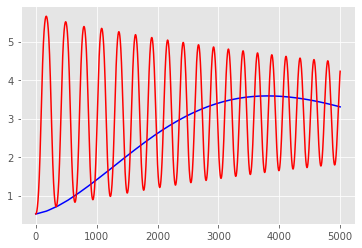

In [74]:
fig, ax = plt.subplots()
sf = 10
for i in range(sf, 10000 + sf, sf):
    ax.plot(tmp2.id, tmp2[str(i)], color="blue")
    ax.plot(tmp2.id, tmp2.theta, color="red")
    plt.savefig(f"img/lgb_trn_{i//sf:05d}.png")
    plt.cla()




## Gen Data

In [101]:

def pendulum_actual(t, state, p):
    # state = [theta, theta_d]

    # Parameters
    mu, L = p

    # Calc derivatives
    theta_d = state[1]
    theta_dd = 9.8 * np.sin(state[0]) / L - mu * state[1]

    return np.array([theta_d, theta_dd])

# Set initial conditions and parameters
tspan = (0, 100)
# tspan = (0, 35)
X0 = np.array([
    [0.524, 1.57, -1.0, -2.5, 0.0, -0.25],  # theta
    [0.0, -1.0, 1.0, 2.0, 0.5, 3.0],  # theta_d
])
X0 = np.array([[0.524], [0.0]])  # 30 degrees, at rest
p = [0.02, 1.0]

# solve ODE
t = np.linspace(*tspan, 10000)
t = np.linspace(*tspan, round(tspan[1] * 100))
# res = solve_ivp(pendulum_actual, tspan, X0, args=[p], dense_output=True)
res_list = []
noise = 1.0
empty_row = pd.DataFrame({"theta": [np.nan], "theta_d": [np.nan]})
for i in range(X0.shape[1]):
    res = solve_ivp(pendulum_actual, tspan, X0[:, i], args=[p], dense_output=True)
    curr_data = pd.DataFrame(res.sol(t).T + noise * np.random.normal(size=(t.shape[0], 2)), columns=["theta", "theta_d"])
    res_list.append(curr_data)
    # res_list.append(empty_row)
data = pd.concat(res_list)
data


,theta,theta_d
0,-0.773819,-0.494594
1,0.038368,-0.312821
2,0.335722,1.578990
3,0.771278,0.062579
4,0.092983,0.584472
...,...,...
9995,3.189394,-1.690894
9996,2.149530,-1.627012
9997,4.098459,-0.510200
9998,4.428901,-2.822270


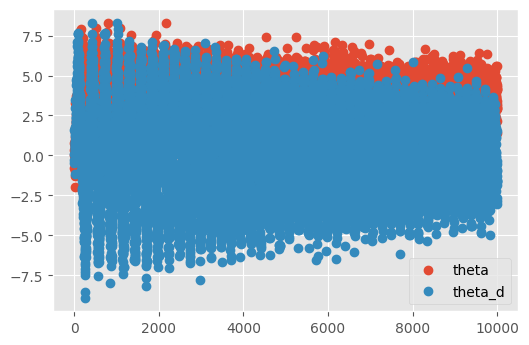

In [102]:
fig, ax = plt.subplots(dpi=100)
data.plot(ax=ax, ls="", marker="o")

plt.show()


## Model data

## Hyperparameter Optimization

[I 2023-05-29 09:29:38,911] A new study created in memory with name: no-name-4d68fa83-bd02-4770-a58b-b442b18a634e


Running hyperparameter tuning for model 1...


c:\Users\robert.robison\.virtualenvs\ar_forecasting\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `num_iterations` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")


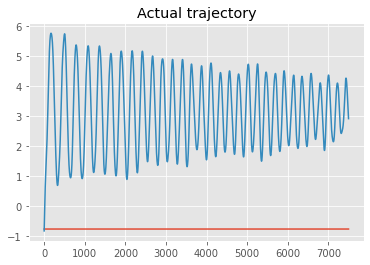

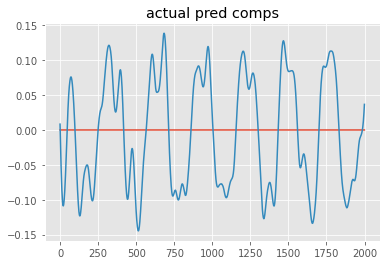

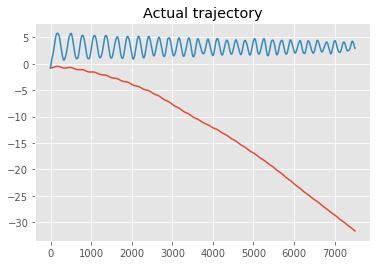

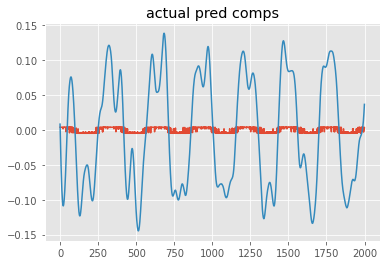

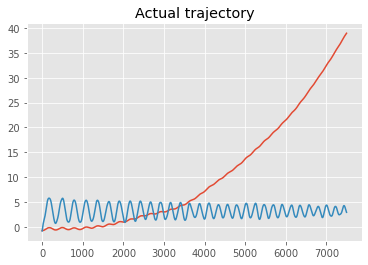

...

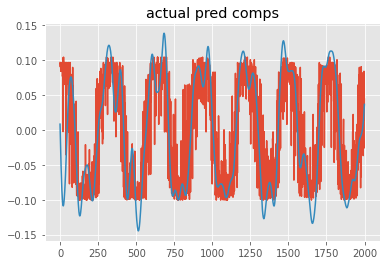

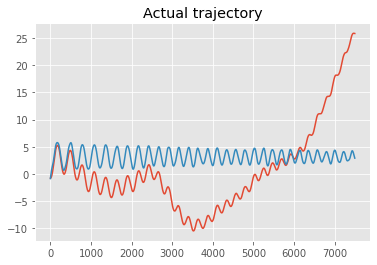

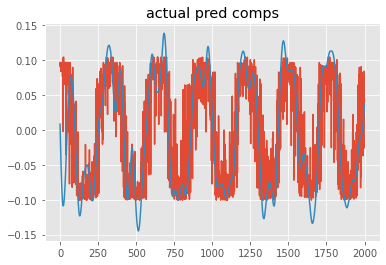

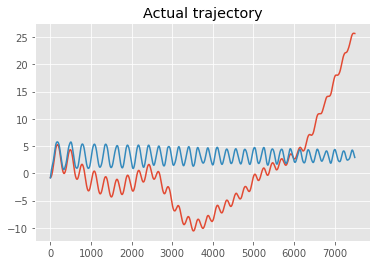

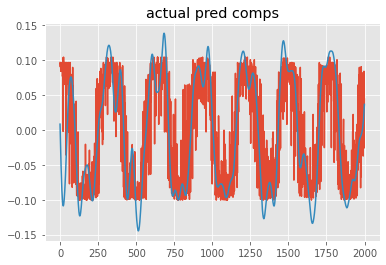

[I 2023-05-29 09:33:43,306] Trial 0 finished with value: 48831221.215531886 and parameters: {'num_iterations': 100, 'learning_rate': 0.01}. Best is trial 0 with value: 48831221.215531886.


Number of finished trials: 1
Best trial:
  Value: 48831221.215531886
  Params: 
    num_iterations: 100
    learning_rate: 0.01


In [122]:
qr = QuantileRegressionSimulator(
    data[["theta"]],
    alphas=[0.2, 0.5, 0.8],
    random_state=5,
    n_diff=2,
    freq=1/3,
    dt=0.01,
)
qr.train()


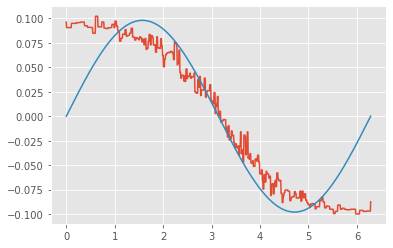

In [121]:
fig, ax = plt.subplots()
theta_vals = np.linspace(0, 2 * np.pi, 1000)
x = np.hstack((theta_vals.reshape(-1, 1), np.repeat(.5, 1000).reshape(-1, 1)))
pred_vals = qr.models[0].predict(x)
ax.plot(theta_vals, pred_vals)
ax.plot(theta_vals, 9.8 * np.sin(theta_vals) / 100)
plt.show()

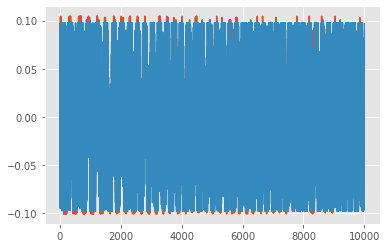

In [124]:
fig, ax = plt.subplots()
x = np.hstack((data.theta.to_numpy().reshape(-1, 1), np.repeat(.5, len(data)).reshape(-1, 1)))
pred_vals = qr.models[0].predict(x)
ax.plot(pred_vals)
ax.plot(9.8 * np.sin(data.theta.to_numpy()) / 100)
plt.show()

### Produce Training Movie

In [85]:
# Create trajectories

# Prep data
tmp = data[["theta"]].iloc[:-1].copy()
x = np.hstack((tmp.to_numpy(), np.repeat(0.5, tmp.shape[0]).reshape(-1, 1)))
hm = _create_helper_mat(tmp.shape[0])
all_traj = []

n_iter = 100
ss = 1
it_vals = list(range(ss, n_iter + ss, ss))
for i in it_vals:
    all_traj.append(pd.Series(_calc_trajectory(qr.models[0].predict(x, num_iteration=i), tmp.theta, hm)))
tmp = pd.concat(all_traj + [tmp], axis=1)
tmp.columns = it_vals + ["theta"]
tmp



,1,2,3,4,5,6,7,8,9,10,...,92,93,94,95,96,97,98,99,100,theta
0,0.550810,0.550810,0.550810,0.550810,0.550810,0.550810,0.550810,0.550810,0.550810,0.550810,...,0.550810,0.550810,0.550810,0.550810,0.550810,0.550810,0.550810,0.550810,0.550810,0.550810
1,0.575330,0.575330,0.575330,0.575330,0.575330,0.575330,0.575330,0.575330,0.575330,0.575330,...,0.575330,0.575330,0.575330,0.575330,0.575330,0.575330,0.575330,0.575330,0.575330,0.575330
2,0.604624,0.609396,0.614169,0.618942,0.623945,0.628822,0.633094,0.637275,0.641315,0.645240,...,0.652937,0.653142,0.652964,0.653168,0.652990,0.652770,0.652854,0.653058,0.652880,0.375002
3,0.638689,0.653008,0.667326,0.681644,0.696653,0.711284,0.724102,0.736643,0.748764,0.760539,...,0.783630,0.784243,0.783709,0.784323,0.783789,0.783130,0.783380,0.783993,0.783459,0.509635
4,0.677528,0.706164,0.734801,0.763437,0.793454,0.822717,0.848353,0.873436,0.897677,0.921228,...,0.972820,0.974047,0.972979,0.974206,0.973138,0.972184,0.972436,0.973664,0.972595,0.552623
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
3494,1748.339898,2849.523842,3395.534062,2430.287361,3427.107983,3467.811854,3046.734436,2825.075473,2673.978693,2197.174542,...,511.659641,1201.849587,603.184664,1222.408482,665.350267,886.428508,516.564932,1247.211117,542.792046,1.914430
3495,1749.161874,2850.791648,3396.896763,2430.817690,3428.062513,3468.625045,3047.131936,2825.178743,2673.856336,2196.629431,...,508.734418,1199.328981,600.317726,1219.898838,662.513613,883.725134,513.644564,1244.720134,539.890408,1.946783
3496,1749.989100,2852.069834,3398.274827,2431.368269,3429.042207,3469.468277,3047.564343,2825.321772,2673.778588,2196.133765,...,505.889757,1196.889163,597.531369,1217.470000,659.757560,881.102534,510.804774,1242.309926,537.069342,1.984178
3497,1750.821576,2853.358400,3399.668188,2431.939032,3430.047000,3470.341486,3048.031591,2825.504496,2673.745385,2195.687478,...,503.131809,1194.536281,594.831745,1215.128117,657.088259,878.566849,508.051699,1239.986632,534.334987,1.825700


ffmpeg -framerate 15 -i lgb_test7_100_0.01/lgb_trn_%05d.png -c:v libx264 -pix_fmt yuv420p lgb_test7_100_0.01.mp4


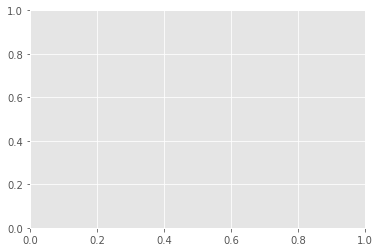

In [86]:
import os
import glob

# Create folder
trial_name = "lgb_test7_100_0.01"
if not os.path.exists(trial_name):
    os.makedirs(trial_name)

# Clear folder
files = glob.glob(f"{trial_name}/*")
for file in files:
    os.remove(file)

fig, ax = plt.subplots()
mt = len(tmp)
for i in range(ss, n_iter + ss, ss):
    ax.plot(np.arange(mt), tmp[i].iloc[:mt], color="blue")
    ax.plot(np.arange(mt), tmp.theta.iloc[:mt], color="red")
    plt.savefig(f"{trial_name}/lgb_trn_{i//ss:05d}.png")
    plt.cla()

print(f"ffmpeg -framerate 15 -i {trial_name}/lgb_trn_%05d.png -c:v libx264 -pix_fmt yuv420p {trial_name}.mp4")


,theta_0.2
0.01001,0.004556
0.02002,0.009595
0.03003,0.004556
0.04004,0.004556
0.05005,0.004556


,theta_0.5
0.01001,0.033879
0.02002,0.034348
0.03003,0.033879
0.04004,0.033879
0.05005,0.033879


,theta_0.8
0.01001,0.062159
0.02002,0.062628
0.03003,0.062159
0.04004,0.062159
0.05005,0.062159


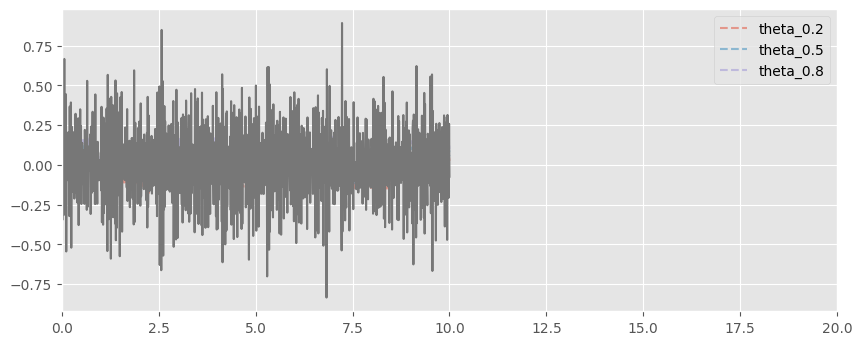

In [ ]:
alpha = [0.2, 0.5, 0.8]
fig, ax = plt.subplots(figsize=(10, 4), dpi=100)
for a in alpha:
    pred = qr.predict(data.iloc[:len(t), [0]], alpha=a)
    pred_df = pd.DataFrame(pred, columns=[f"{col}_{a}" for col in ["theta"]])
    # pred_df = pd.DataFrame(pred + data.to_numpy(), columns=[f"{col}_{a}" for col in data.columns])
    pred_df = pred_df.iloc[:-1]
    pred_df.index=t[1:]
    pred_df.plot(ax=ax, ls="--", alpha=0.5)
    display(pred_df.head())
ax.plot(t, ((data - data.shift(1) - (data.shift(1) - data.shift(2)))).iloc[:len(t), 0])
# ax.plot(t, (data - data.shift()).iloc[:len(t), 1])
ax.set_xlim(0, 20)
# ax.set_xlim(20, 40)
plt.show()

,theta_0.2
0.010001,0.000024
0.020002,0.000024
0.030003,0.000024
0.040004,0.000024
0.050005,0.000024


,theta_0.5
0.010001,0.000047
0.020002,0.000047
0.030003,0.000047
0.040004,0.000047
0.050005,0.000047


,theta_0.8
0.010001,0.000113
0.020002,0.000113
0.030003,0.000113
0.040004,0.000113
0.050005,0.000113


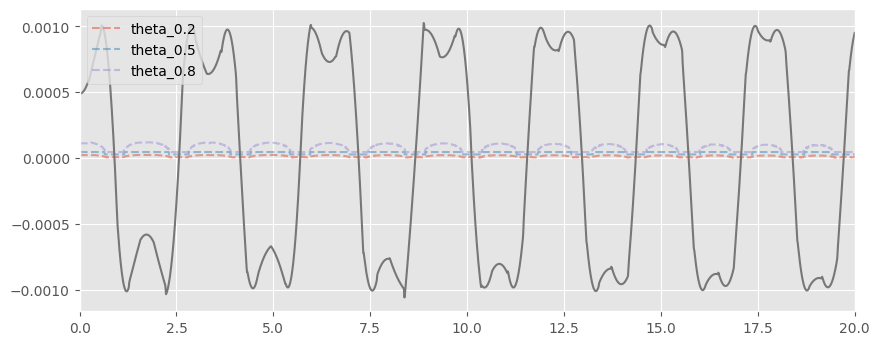

In [ ]:
alpha = [0.2, 0.5, 0.8]
fig, ax = plt.subplots(figsize=(10, 4), dpi=100)
for a in alpha:
    pred = qr.predict(data.iloc[:len(t), [0]], alpha=a)
    pred_df = pd.DataFrame(pred, columns=[f"{col}_{a}" for col in ["theta"]])
    # pred_df = pd.DataFrame(pred + data.to_numpy(), columns=[f"{col}_{a}" for col in data.columns])
    pred_df = pred_df.iloc[:-1]
    pred_df.index=t[1:]
    pred_df.plot(ax=ax, ls="--", alpha=0.5)
    display(pred_df.head())
ax.plot(t, ((data - data.shift(1) - (data.shift(1) - data.shift(2)))).iloc[:len(t), 0])
# ax.plot(t, (data - data.shift()).iloc[:len(t), 1])
ax.set_xlim(0, 20)
# ax.set_xlim(20, 40)
plt.show()

In [ ]:
0.00001 == 1e-5

True

,theta_0.2
0.010001,0.000261
0.020002,0.000261
0.030003,0.000261
0.040004,0.000261
0.050005,0.000261


,theta_0.5
0.010001,0.000592
0.020002,0.000592
0.030003,0.000592
0.040004,0.000592
0.050005,0.000592


,theta_0.8
0.010001,0.000954
0.020002,0.000954
0.030003,0.000954
0.040004,0.000954
0.050005,0.000954


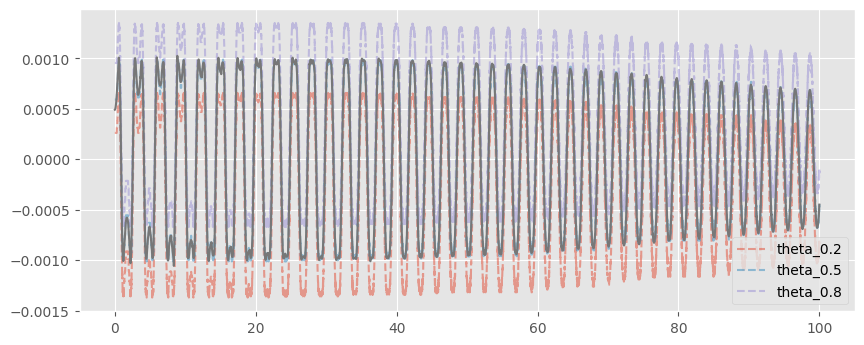

In [ ]:
alpha = [0.2, 0.5, 0.8]
fig, ax = plt.subplots(figsize=(10, 4), dpi=100)
for a in alpha:
    pred = qr.predict(data.iloc[:len(t), [0]], alpha=a)
    pred_df = pd.DataFrame(pred, columns=[f"{col}_{a}" for col in ["theta"]])
    # pred_df = pd.DataFrame(pred + data.to_numpy(), columns=[f"{col}_{a}" for col in data.columns])
    pred_df = pred_df.iloc[:-1]
    pred_df.index=t[1:]
    pred_df.plot(ax=ax, ls="--", alpha=0.5)
    display(pred_df.head())
ax.plot(t, ((data - data.shift(1) - (data.shift(1) - data.shift(2)))).iloc[:len(t), 0])
# ax.plot(t, (data - data.shift()).iloc[:len(t), 1])
# ax.set_xlim(0, 20)
# ax.set_xlim(20, 40)
plt.show()

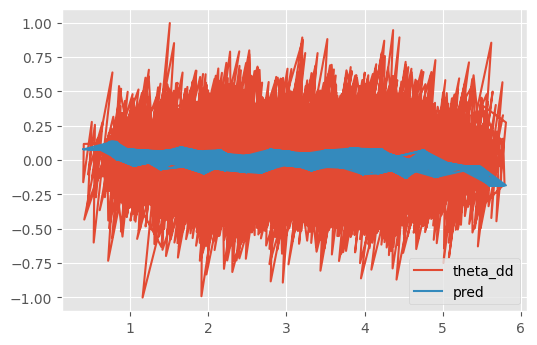

In [ ]:
preds = qr.predict(data[["theta"]], alpha=0.5)
tmp = pd.DataFrame({
    "theta_dd": ((data.theta - data.theta.shift(1) - (data.theta.shift(1) - data.theta.shift(2)))).to_numpy(),
    "pred": preds[:, 0],
}, index=data.theta.to_numpy())
fig, ax = plt.subplots(dpi=100)
tmp.plot(ax=ax)
plt.show()

In [ ]:
from tqdm import tqdm


nsims = 10
sims = np.zeros((nsims, len(t), data.shape[1]))
X0 = data.copy().iloc[0].to_numpy()
X0=data.iloc[1, [0]].to_numpy()
X0_prev=data.iloc[0, [0]].to_numpy()
for i in tqdm(range(nsims)):
    sims[i, ...] = qr.simulate_path(X0=X0, steps=len(t), sample=True, X0_prev=X0_prev)
    # sims[i, ...] = qr.simulate_path(data.iloc[0].to_numpy(), len(t), sample=True)
    

100%|██████████| 10/10 [00:25<00:00,  2.57s/it]


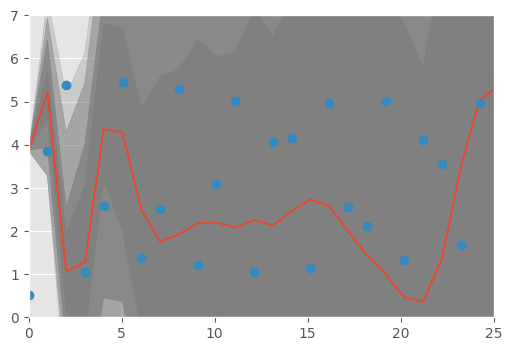

In [ ]:

fig, ax = plt.subplots(dpi=100)
alpha = [0.5, 0.8, 0.95, 0.995]
for i, a in enumerate(reversed(sorted(alpha))):
    a2 = (1 - a) / 2
    ax.fill_between(t, y1=np.quantile(sims[..., 0], a2, axis=0), y2=np.quantile(sims[..., 0], 1 - a2, axis=0), alpha=0.25 * (i + 1), color="gray", label=alpha)
# for i in range(nsims):
#     ax.plot(t, sims[i, :, 0], label="", c="gray", alpha=0.25)
ax.plot(t, sims[:, :, 0].mean(axis=0), label="mean")
ax.plot(t, data.theta.iloc[:len(t)], ls="", marker="o")
# data.iloc[:len(t)].theta.plot(ax=ax, ls="", marker="o")
ax.set_xlim(0, 25)
ax.set_ylim(0,7)
plt.show()


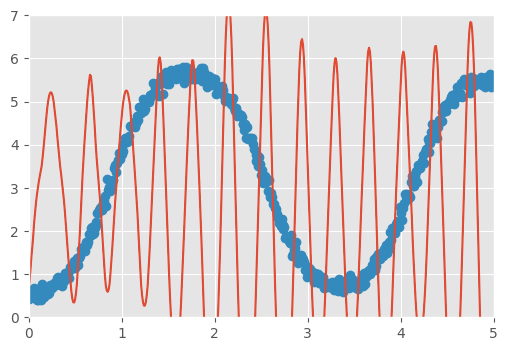

In [ ]:

fig, ax = plt.subplots(dpi=100)
alpha = [0.5, 0.8, 0.95, 0.995]
for i, a in enumerate(reversed(sorted(alpha))):
    a2 = (1 - a) / 2
    ax.fill_between(t, y1=np.quantile(sims[..., 0], a2, axis=0), y2=np.quantile(sims[..., 0], 1 - a2, axis=0), alpha=0.25 * (i + 1), color="gray", label=alpha)
# for i in range(nsims):
#     ax.plot(t, sims[i, :, 0], label="", c="gray", alpha=0.25)
ax.plot(t, sims[:, :, 0].mean(axis=0), label="mean")
ax.plot(t, data.theta.iloc[:len(t)], ls="", marker="o", zorder=1)
# data.iloc[:len(t)].theta.plot(ax=ax, ls="", marker="o")
ax.set_xlim(0, 5)
ax.set_ylim(0,7)
plt.show()


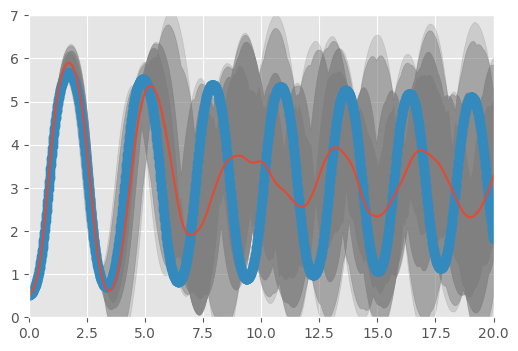

In [ ]:

fig, ax = plt.subplots(dpi=100)
alpha = [0.5, 0.8, 0.95, 0.995]
for i, a in enumerate(reversed(sorted(alpha))):
    a2 = (1 - a) / 2
    ax.fill_between(t, y1=np.quantile(sims[..., 0], a2, axis=0), y2=np.quantile(sims[..., 0], 1 - a2, axis=0), alpha=0.25 * (i + 1), color="gray", label=alpha)
# for i in range(nsims):
#     ax.plot(t, sims[i, :, 0], label="", c="gray", alpha=0.25)
ax.plot(t, sims[:, :, 0].mean(axis=0), label="mean")
ax.plot(t, data.theta.iloc[:len(t)], ls="", marker="o", zorder=1)
# data.iloc[:len(t)].theta.plot(ax=ax, ls="", marker="o")
ax.set_xlim(0, 20)
ax.set_ylim(0,7)
plt.show()


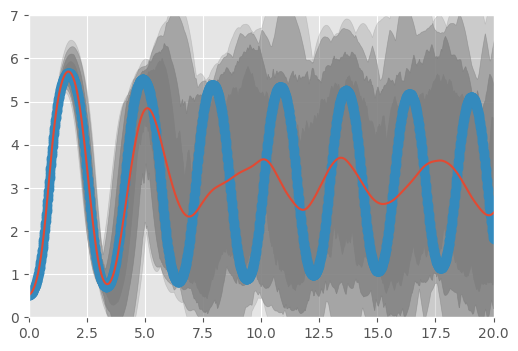

In [ ]:

fig, ax = plt.subplots(dpi=100)
alpha = [0.5, 0.8, 0.95, 0.995]
for i, a in enumerate(reversed(sorted(alpha))):
    a2 = (1 - a) / 2
    ax.fill_between(t, y1=np.quantile(sims[..., 0], a2, axis=0), y2=np.quantile(sims[..., 0], 1 - a2, axis=0), alpha=0.25 * (i + 1), color="gray", label=alpha)
# for i in range(nsims):
#     ax.plot(t, sims[i, :, 0], label="", c="gray", alpha=0.25)
ax.plot(t, sims[:, :, 0].mean(axis=0), label="mean")
ax.plot(t, data.theta.iloc[:len(t)], ls="", marker="o", zorder=1)
# data.iloc[:len(t)].theta.plot(ax=ax, ls="", marker="o")
ax.set_xlim(0, 20)
ax.set_ylim(0,7)
plt.show()


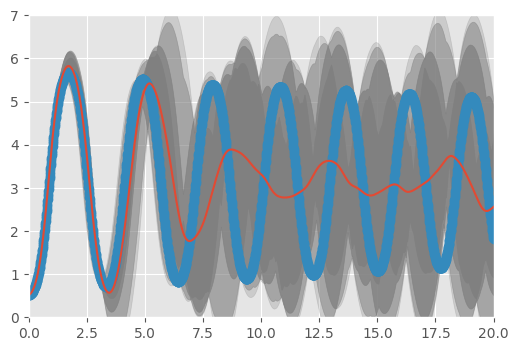

In [ ]:

fig, ax = plt.subplots(dpi=100)
alpha = [0.5, 0.8, 0.95, 0.995]
for i, a in enumerate(reversed(sorted(alpha))):
    a2 = (1 - a) / 2
    ax.fill_between(t, y1=np.quantile(sims[..., 0], a2, axis=0), y2=np.quantile(sims[..., 0], 1 - a2, axis=0), alpha=0.25 * (i + 1), color="gray", label=alpha)
# for i in range(nsims):
#     ax.plot(t, sims[i, :, 0], label="", c="gray", alpha=0.25)
ax.plot(t, sims[:, :, 0].mean(axis=0), label="mean")
ax.plot(t, data.theta.iloc[:len(t)], ls="", marker="o", zorder=1)
# data.iloc[:len(t)].theta.plot(ax=ax, ls="", marker="o")
ax.set_xlim(0, 20)
ax.set_ylim(0,7)
plt.show()


In [ ]:
tmp = data.iloc[:-1].copy()
tmp[["y_pred"]] = qr.predict(data[["theta"]], 0.5)[:-1]
tmp["pred_theta"] = tmp.theta.iloc[0]
tmp["pred_theta"].iloc[1] = tmp.theta.iloc[1]
for i in range(2, tmp.shape[0]):
    tmp["pred_theta"].iloc[i] = tmp["pred_theta"].iloc[i - 1] + tmp.y_pred.iloc[i] + (tmp["pred_theta"].iloc[i - 1] - tmp["pred_theta"].iloc[i - 2])

In [ ]:
tmp = data[["theta"]].iloc[:-1].copy()
x = np.hstack((tmp.to_numpy(), np.repeat(0.5, tmp.shape[0]).reshape(-1, 1)))
hm = _create_helper_mat(tmp.shape[0])
for i in range(1, 10001, 1):
    tmp[i] = _calc_trajectory(qr.models[0].predict(x, num_iteration=i), tmp.theta, hm)



C:\Users\robert.robison\AppData\Local\Temp/ipykernel_24136/2398410816.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  tmp[i] = _calc_trajectory(qr.models[0].predict(x, num_iteration=i), tmp.theta, hm)
C:\Users\robert.robison\AppData\Local\Temp/ipykernel_24136/2398410816.py:5: PerformanceWarning: DataFrame is highly fragmented.  This is usually the result of calling `frame.insert` many times, which has poor performance.  Consider joining all columns at once using pd.concat(axis=1) instead. To get a de-fragmented frame, use `newframe = frame.copy()`
  tmp[i] = _calc_trajectory(qr.models[0].predict(x, num_iteration=i), tmp.theta, hm)
C:\Users\robert.robison\AppData\Local\Temp/ipykernel_24136/2398410816.py:5: PerformanceWarning: DataFrame is highly fragment

In [ ]:
qr.models[0].num_trees()

10000

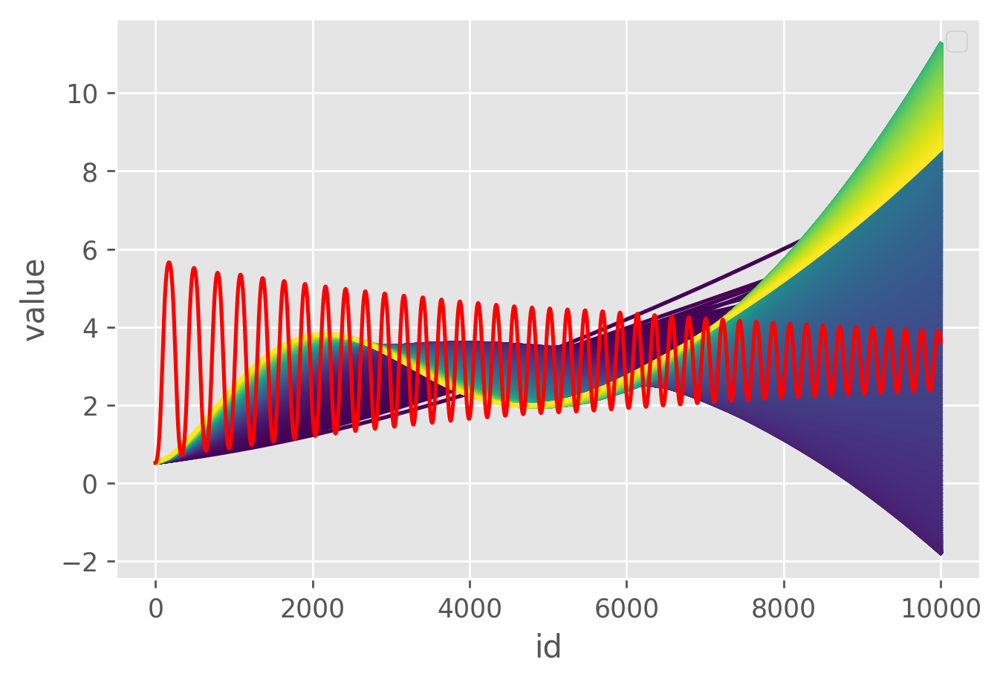

In [ ]:
tmp = tmp.reindex(columns=[col for col in tmp.columns if col != "theta"] + ["theta"])
tmp["id"] = range(len(tmp))
long = pd.melt(tmp.drop(columns="theta"), id_vars=["id"])

fig, ax = plt.subplots(dpi=250)
mt = 50000
sns.lineplot(data=long[(long.id < mt) & (long.variable.between(2, 1000))], x="id", y="value", hue="variable", palette="viridis", ax=ax)
ax.plot(tmp.id.iloc[:mt], tmp.theta.iloc[:mt], color="red")
ax.legend([])
plt.show()

In [ ]:
qr.models[0].save_model("lgb_pend_est.txt")

In [ ]:
long = pd.melt(tmp.drop(columns="theta"), id_vars=["id"])


MemoryError: Unable to allocate 763. MiB for an array with shape (1, 100000000) and data type int64

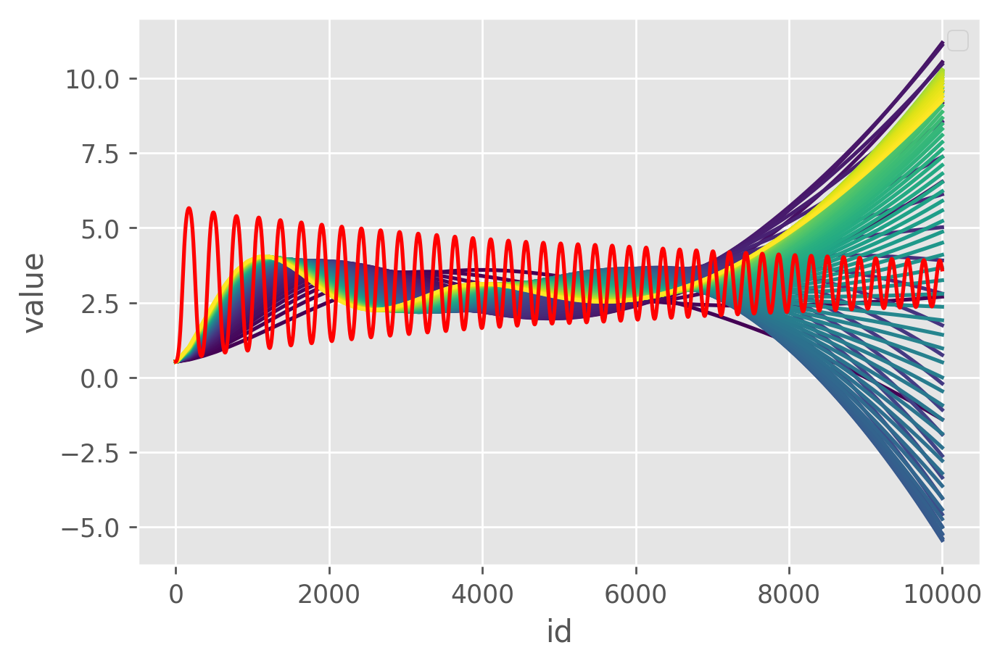

In [ ]:
tmp = tmp.reindex(columns=[col for col in tmp.columns if col != "theta"] + ["theta"])
tmp["id"] = range(len(tmp))
cols = list(range(100, 10100, 100))
long = pd.melt(tmp[cols + ["id"]], id_vars=["id"])
# long = pd.melt(tmp.drop(columns="theta"), id_vars=["id"])

fig, ax = plt.subplots(dpi=250)
mt = 50000
sns.lineplot(data=long[(long.id < mt) & (long.variable.isin(range(100, 10100, 100)))], x="id", y="value", hue="variable", palette="viridis", ax=ax)
ax.plot(tmp.id.iloc[:mt], tmp.theta.iloc[:mt], color="red")
ax.legend([])
plt.show()

In [ ]:
tmp.columns = [str(col) for col in tmp.columns]
tmp.to_feather("pend_est_sim.ftr")

<AxesSubplot:>

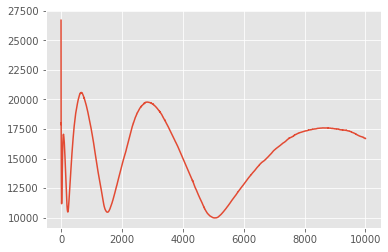

In [ ]:
err_sum = pd.Series([(tmp[i] - tmp.theta).abs().sum() for i in range(1, 10001)])
err_sum.plot()

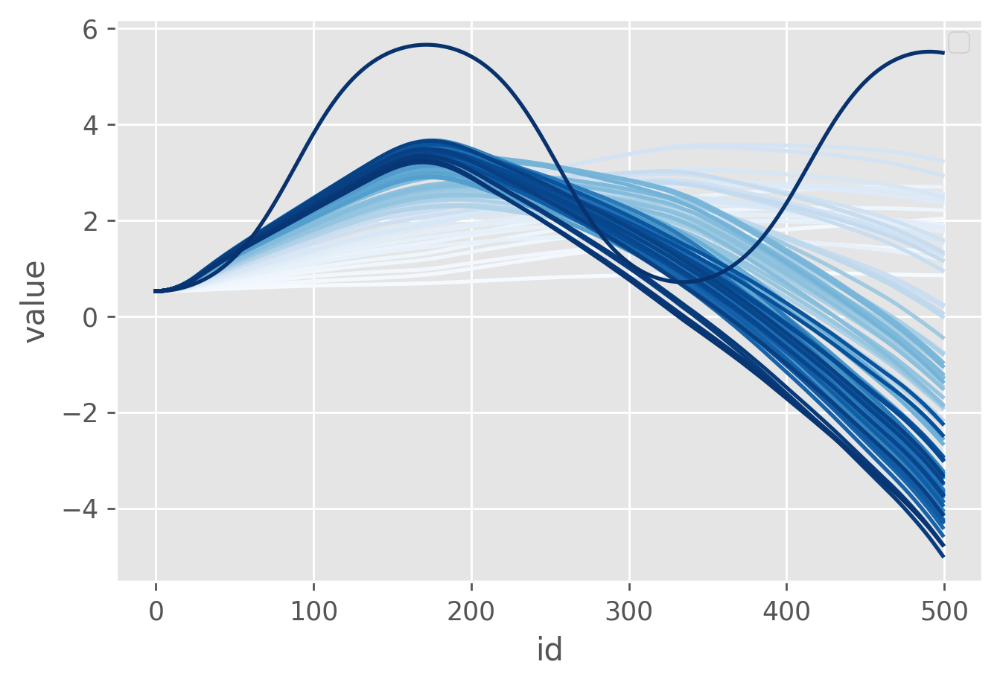

In [ ]:
import seaborn as sns 
tmp = tmp.reindex(columns=[col for col in tmp.columns if col != "theta"] + ["theta"])
tmp["id"] = range(len(tmp))
long = pd.melt(tmp, id_vars=["id"])

fig, ax = plt.subplots(dpi=250)
sns.lineplot(data=long[long.id < 500], x="id", y="value", hue="variable", palette="Blues", ax=ax)

ax.legend([])
plt.show()

In [ ]:
tmp.shape

(10000, 102)

<AxesSubplot:>

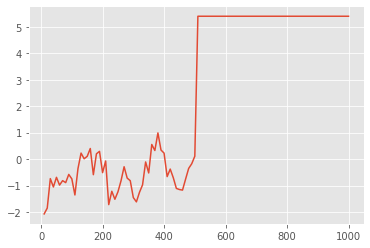

In [ ]:
tmp.iloc[100, :100].T.plot()

In [ ]:
qr.models[0].num_trees()

501

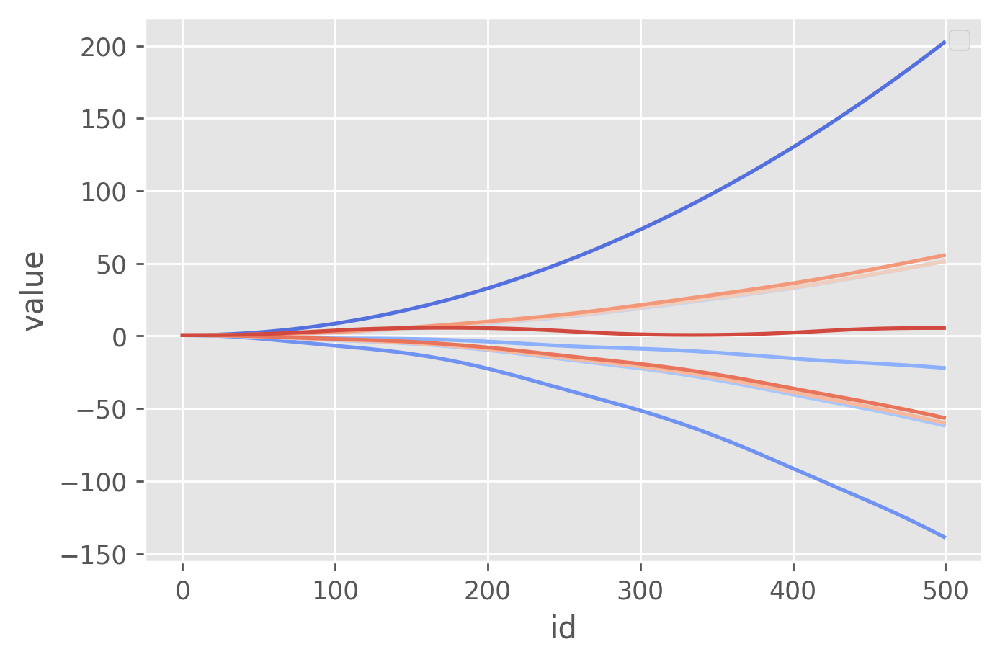

In [ ]:
import seaborn as sns 
tmp = tmp.reindex(columns=[col for col in tmp.columns if col != "theta"] + ["theta"])
tmp["id"] = range(len(tmp))
long = pd.melt(tmp, id_vars=["id"])

fig, ax = plt.subplots(dpi=250)
sns.lineplot(data=long[long.id < 500], x="id", y="value", hue="variable", palette="coolwarm", ax=ax)

ax.legend([])
plt.show()

In [ ]:

fig, ax = plt.subplots(dpi=100)
tmp[:500].plot(ax=ax)
plt.show()

In [ ]:
tmp

,theta,pred_1,pred_10,pred_20,pred_30,pred_40,pred_50,pred_60
0,0.524000,0.524000,0.524000,0.524000,0.524000,0.524000,0.524000,0.524000
1,0.524245,0.524245,0.524245,0.524245,0.524245,0.524245,0.524245,0.524245
2,0.524981,0.524537,0.524537,0.524537,0.524537,0.524537,0.524537,0.524537
3,0.526208,0.524877,0.524877,0.524877,0.524877,0.524877,0.524877,0.524877
4,0.527926,0.525263,0.525263,0.525263,0.525263,0.525263,0.525263,0.525263
...,...,...,...,...,...,...,...,...
9995,3.675357,1764.254408,1764.254408,1764.254408,1764.254408,1764.254408,1764.254408,1764.254408
9996,3.658709,1764.582312,1764.582312,1764.582312,1764.582312,1764.582312,1764.582312,1764.582312
9997,3.641581,1764.910245,1764.910245,1764.910245,1764.910245,1764.910245,1764.910245,1764.910245
9998,3.623987,1765.238206,1765.238206,1765.238206,1765.238206,1765.238206,1765.238206,1765.238206


In [ ]:
np.repeat([1,2,3], 5)

array([1, 1, 1, 1, 1, 2, 2, 2, 2, 2, 3, 3, 3, 3, 3])

In [ ]:
tdist = np.linspace(0.5, 5.5, 1000).reshape(-1, 1)

# Preds
preds = qr.predict(tdist, 0.5)

# Actuals
act = np.zeros(tdist.shape[0])
for i in range(tdist.shape[0]):
    act[i] = pendulum_actual(tdist, tdist[i], p)[:, 1]

# Compare
tmp = pd.DataFrame({"Preds": preds, "Actual": act})
tmp.plot()

IndexError: index 1 is out of bounds for axis 0 with size 1

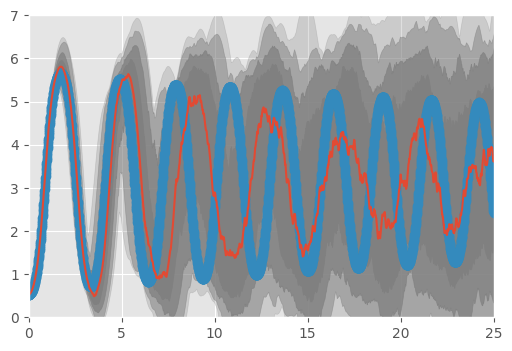

In [ ]:

fig, ax = plt.subplots(dpi=100)
alpha = [0.5, 0.8, 0.95, 0.995]
for i, a in enumerate(reversed(sorted(alpha))):
    a2 = (1 - a) / 2
    ax.fill_between(t, y1=np.quantile(sims[..., 0], a2, axis=0), y2=np.quantile(sims[..., 0], 1 - a2, axis=0), alpha=0.25 * (i + 1), color="gray", label=alpha)
# for i in range(nsims):
#     ax.plot(t, sims[i, :, 0], label="", c="gray", alpha=0.25)
ax.plot(t, np.median(sims[:, :, 0], axis=0), label="mean")
# ax.plot(t, sims[:, :, 0].mean(axis=0), label="mean")
ax.plot(t, data.theta.iloc[:len(t)], ls="", marker="o", zorder=1)
# data.iloc[:len(t)].theta.plot(ax=ax, ls="", marker="o")
ax.set_xlim(0, 25)
ax.set_ylim(0,7)
plt.show()


In [ ]:
sims = real_sims[:10, ...].copy()

In [ ]:
sims2 = sims.copy()

In [ ]:
real_sims = sims.copy()

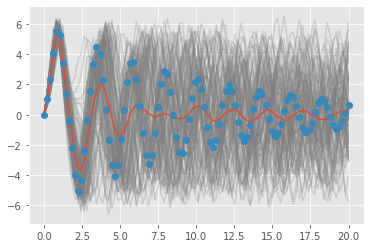

In [ ]:

fig, ax = plt.subplots()
# alpha = [0.5, 0.8, 0.95, 0.995]
# for i, a in enumerate(reversed(sorted(alpha))):
#     a2 = (1 - a) / 2
#     ax.fill_between(all_t, y1=np.quantile(theta_sims, a2, axis=1), y2=np.quantile(theta_sims, 1 - a2, axis=1), alpha=0.25 * (i + 1), color="gray", label=alpha)
for i in range(nsims):
    ax.plot(t, sims[i, :, 1], label="", c="gray", alpha=0.25)
ax.plot(t, sims[:, :, 1].mean(axis=0), label="mean")
ax.plot(t, data.theta_d.iloc[:len(t)], ls="", marker="o")
# data.iloc[:len(t)].theta.plot(ax=ax, ls="", marker="o")
plt.show()


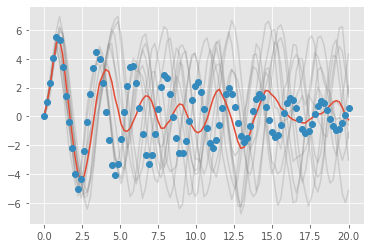

In [ ]:


fig, ax = plt.subplots()
# alpha = [0.5, 0.8, 0.95, 0.995]
# for i, a in enumerate(reversed(sorted(alpha))):
#     a2 = (1 - a) / 2
#     ax.fill_between(all_t, y1=np.quantile(theta_sims, a2, axis=1), y2=np.quantile(theta_sims, 1 - a2, axis=1), alpha=0.25 * (i + 1), color="gray", label=alpha)
for i in range(nsims):
    ax.plot(data.index, sims[i, :, 1], label="", c="gray", alpha=0.25)
ax.plot(data.index, sims[:, :, 1].mean(axis=0), label="mean")
data.theta_d.plot(ax=ax, ls="", marker="o")
plt.show()


In [ ]:
qr.models[0].get_params()


AttributeError: 'Booster' object has no attribute 'get_params'

In [ ]:
qr.models[1].params


{}

## github example

In [ ]:
sample_size=500
alphas = [0.3, 0.4, 0.5, 0.6, 0.7]
x = np.linspace(-10, 10, sample_size).reshape(-1, 1)
x_test = np.linspace(-10, 10, sample_size).reshape(-1, 1)
y_noise = np.sin(x[:, 0]) + np.random.uniform(-0.4, 0.4, sample_size)
y_test = np.sin(x_test[:, 0]) + np.random.uniform(-0.4, 0.4, sample_size)
params = {
    "max_depth": 4,
    "num_leaves": 5,
    "learning_rate": 0.1,
    "n_estimators": 50,
    # "boosting_type": "gbdt",
}
monotonic_quantile_regressor = MonotonicQuantileRegressor(x=x, y=y_noise, m_factor=500)
model = monotonic_quantile_regressor.train(params=params)
preds = monotonic_quantile_regressor.predict(x=x_test, alphas=alphas)
preds_df = pd.DataFrame(preds)
(preds_df.diff(axis = 1) < 0).sum(axis = 1).sum(axis = 0)

c:\Users\robert.robison\.virtualenvs\ar_forecasting\lib\site-packages\lightgbm\engine.py:177: UserWarning: Found `n_estimators` in params. Will use it instead of argument
  _log_warning(f"Found `{alias}` in params. Will use it instead of argument")
c:\Users\robert.robison\.virtualenvs\ar_forecasting\lib\site-packages\lightgbm\engine.py:239: UserWarning: 'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. Pass 'log_evaluation()' callback via 'callbacks' argument instead.
  _log_warning("'verbose_eval' argument is deprecated and will be removed in a future release of LightGBM. "


[LightGBM] [Warning] Using self-defined objective function
[LightGBM] [Warning] Auto-choosing col-wise multi-threading, the overhead of testing was 0.011542 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1014
[LightGBM] [Info] Number of data points in the train set: 250000, number of used features: 4
[LightGBM] [Warning] Using self-defined objective function


0

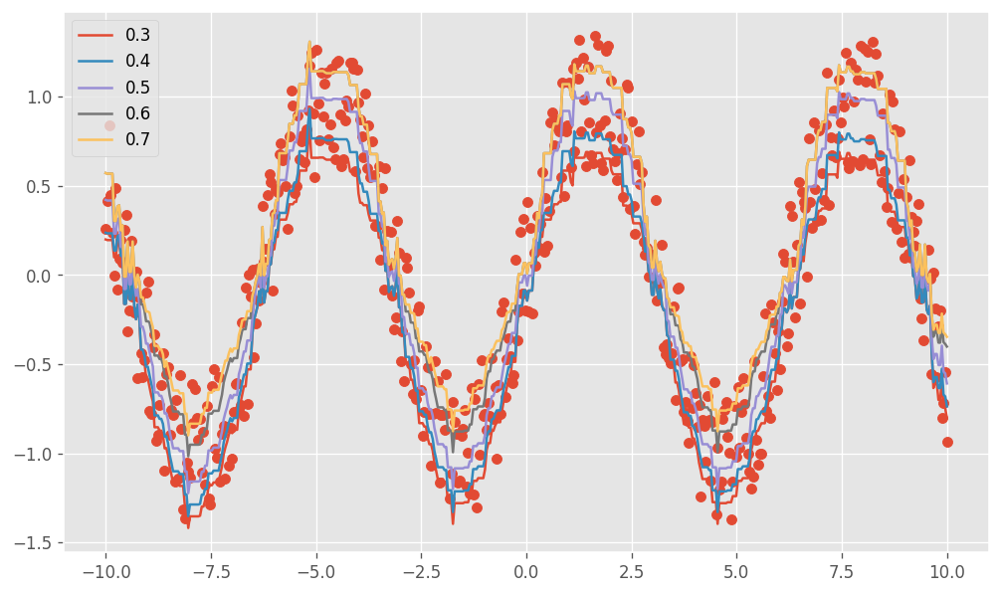

In [ ]:
preds_df.columns = alphas
preds_df.index = x_test[:, 0]

fig, ax = plt.subplots(dpi=120, figsize=(10, 6))
ax.scatter(x_test[:, 0], y_test, label="Test data")
preds_df.plot(ax=ax)
plt.show()